In [1]:
#import libraries
import scanpy as sc
import matplotlib as mpl
from matplotlib.pyplot import rcParams
import seaborn as sns

In [2]:
#settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(color_map='viridis')
sc.settings.set_figure_params(dpi=80, facecolor='white')

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.10.3 anndata==0.10.6 umap==0.5.5 numpy==1.26.4 scipy==1.11.4 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


In [3]:
#results file
results_file = '/Users/rvi33352/Documents/sc RNA seq analysis/results files/JupyterLW_Scanpy.h5ad'  # the file that will store the analysis results

In [4]:
#read h5 OR h5ac
adata = sc.read_10x_h5(filename = '/Users/rvi33352/Documents/sc RNA seq analysis/Phex/WT/filtered_feature_bc_matrix.h5')
#adata = sc.read_h5ad(filename = 'previous results file here')
adata

reading /Users/rvi33352/Documents/sc RNA seq analysis/Phex/WT/filtered_feature_bc_matrix.h5
 (0:00:00)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 9719 × 33696
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
adata.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


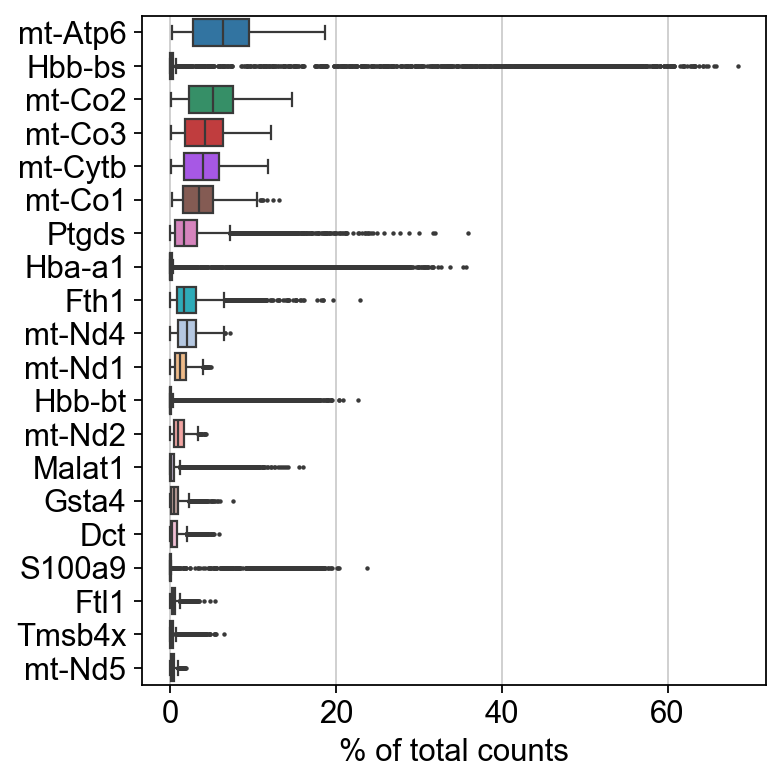

In [6]:
#highest expressed genes
sc.pl.highest_expr_genes(adata, n_top=20, )

filtered out 542 cells that have less than 200 genes expressed
filtered out 14069 genes that are detected in less than 3 cells
Running Scrublet
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.53
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 16.7%
    Scrublet finished (0:00:46)


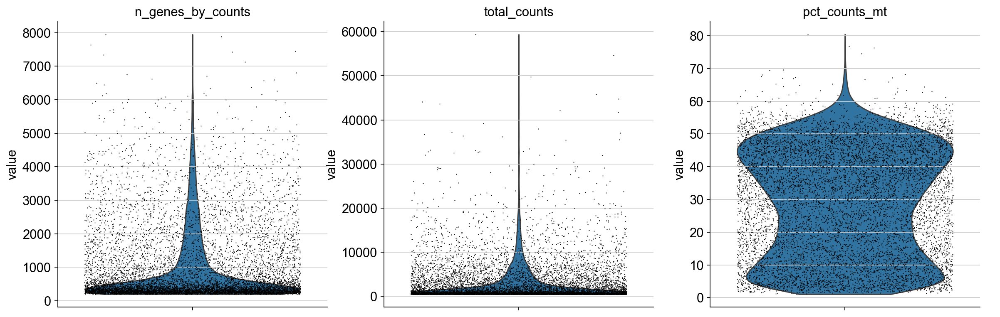

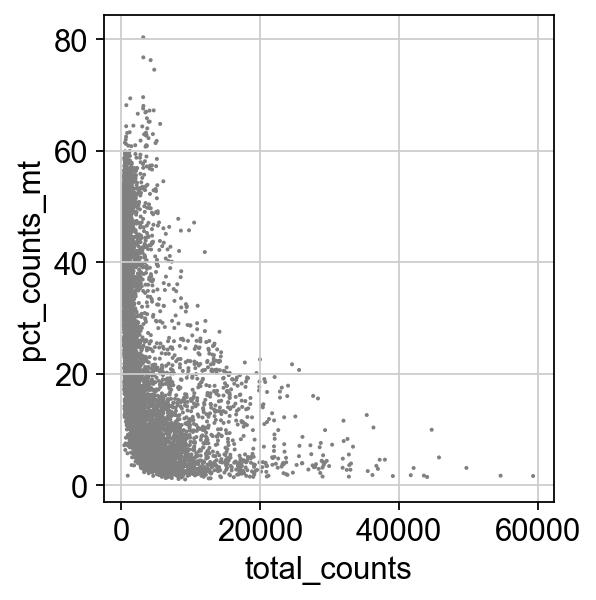

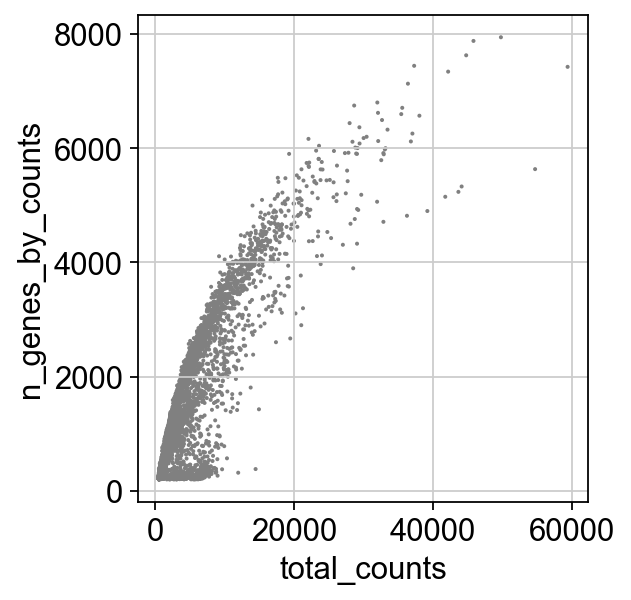

In [7]:
#filtering and normalization
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.scrublet(adata)
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

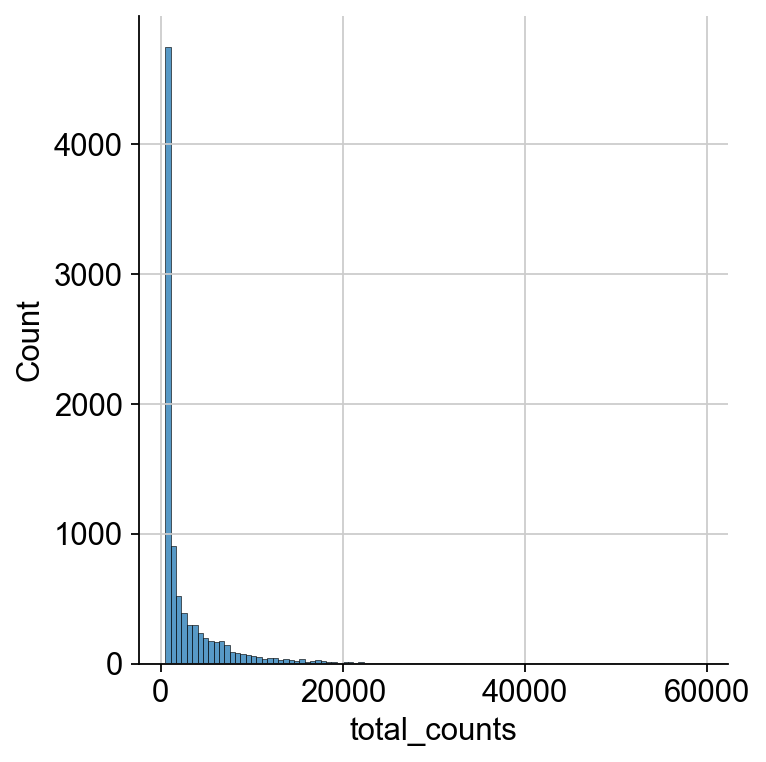

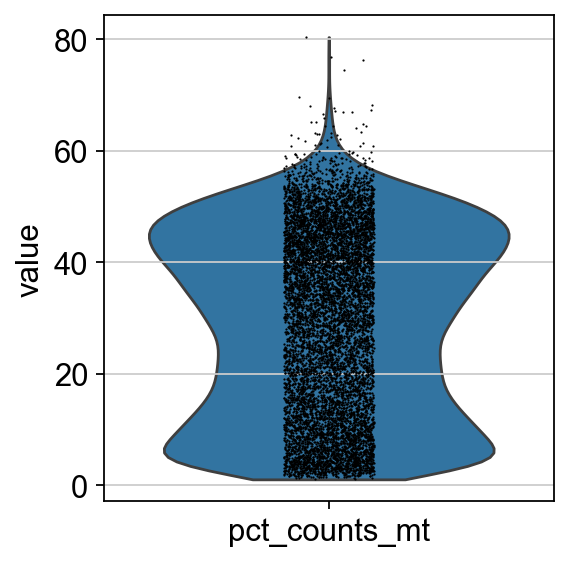

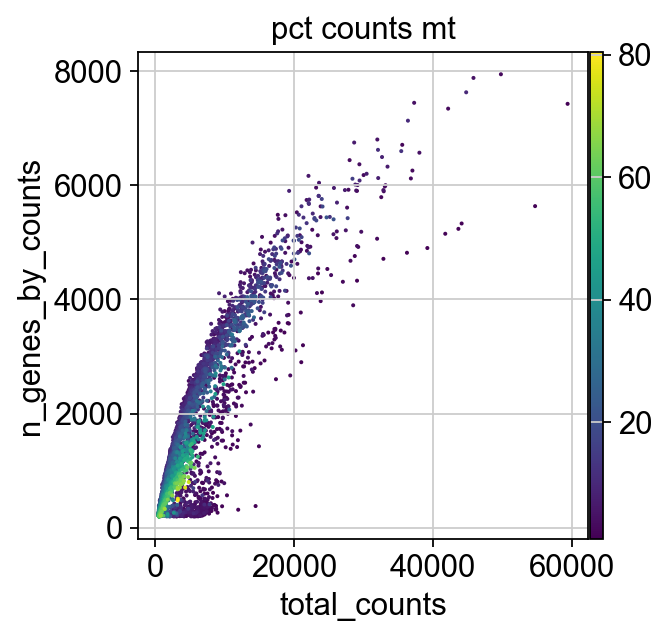

In [8]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [9]:
#filtering counts and Mt rna
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 30, :]

In [10]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


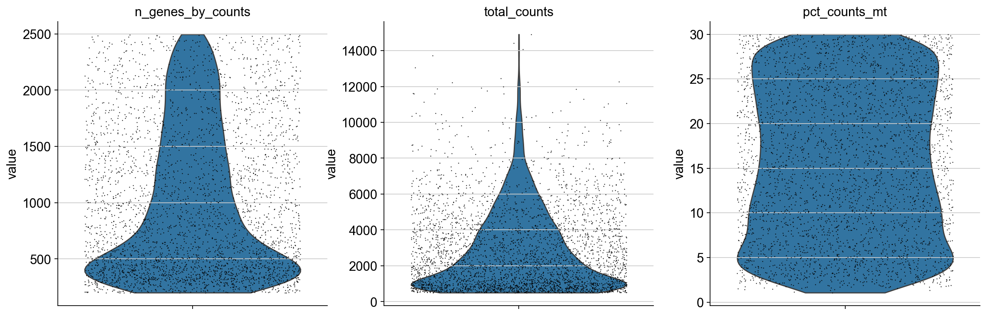

In [11]:
#view filtered QC metrics
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


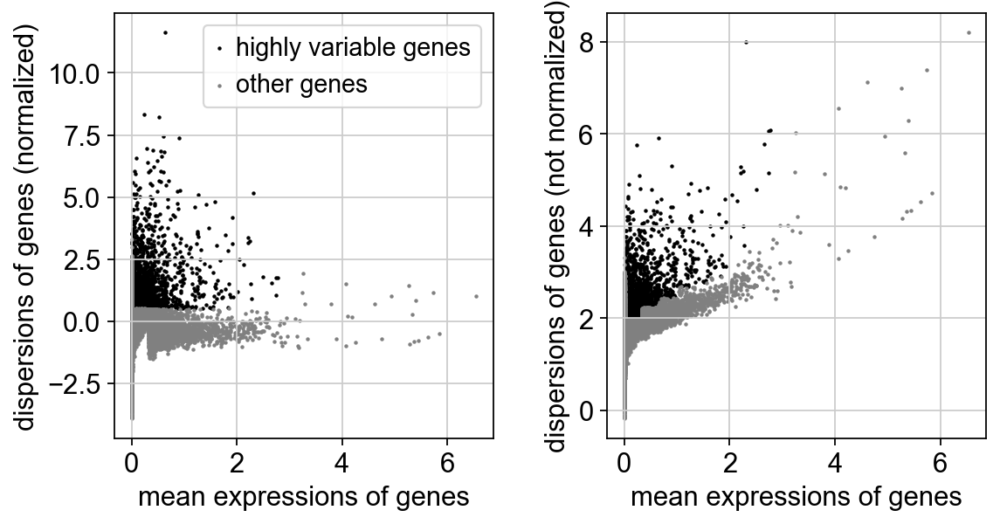

In [12]:
#identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [13]:
adata

AnnData object with n_obs × n_vars = 3531 × 19627
    obs: 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'hvg'

In [14]:
#set raw data
adata.raw = adata

In [15]:
#filter highly variable genes only
adata = adata[:, adata.var.highly_variable]

In [16]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [17]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [18]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

computing neighbors
computing PCA
    with n_comps=20


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 4303 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


    finished (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [19]:
#compute PCA
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:02)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:03)


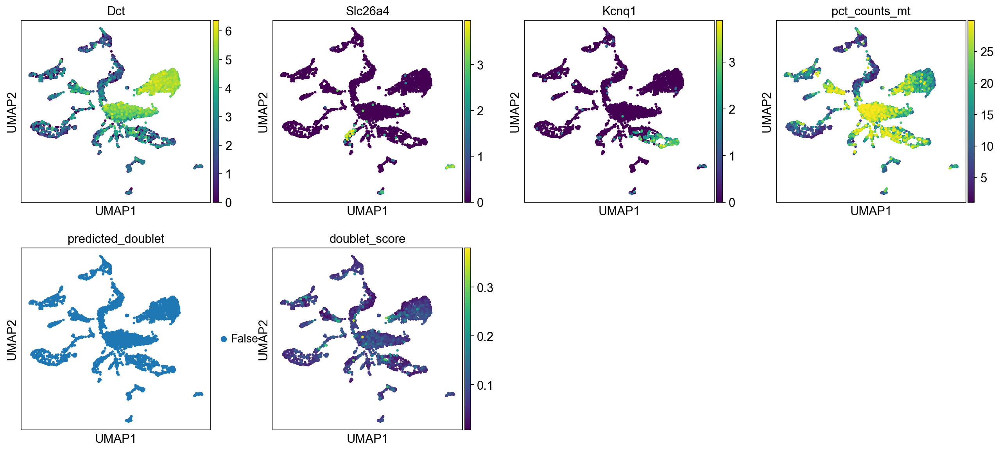

In [20]:
#compute and plot UMAP with SV/LW marker genes
sc.tl.umap(adata) 
sc.pl.umap(adata, color=['Dct', 'Slc26a4', 'Kcnq1', "pct_counts_mt", "predicted_doublet", "doublet_score"]) 

In [21]:
#cluster
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 30 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/var/folders/hc/zpcxpzxn4595ny8kwvhby8m81lyslp/T/ipykernel_45111/2840629800.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


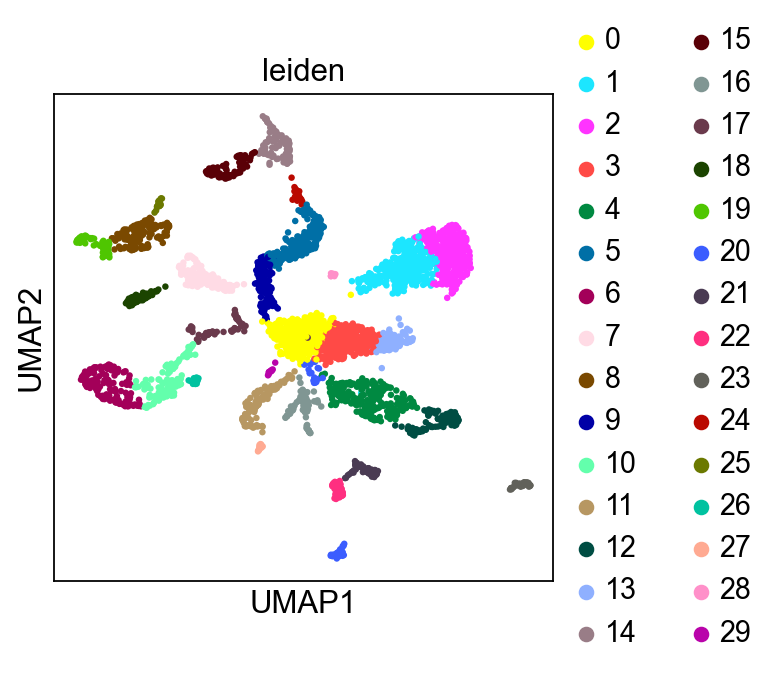

In [22]:
#plot culstering with resolution = 1
sc.pl.umap(adata, color = 'leiden')

In [23]:
#cluster and plot at different resolutions to identify optimal one
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res,
    )

running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 40 clusters and added
    'leiden_res_2.00', the cluster labels (adata.obs, categorical) (0:00:00)


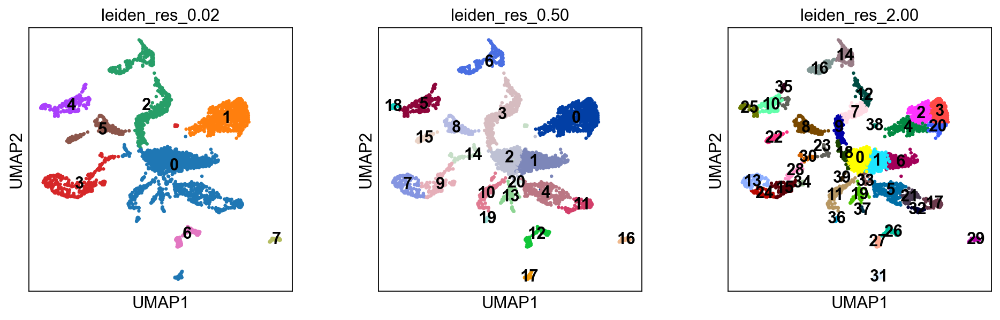

In [24]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_2.00"],
    legend_loc="on data",
)

In [25]:
#define known marker genes
marker_genes = {
    "Marginal": ["Kcne1", "Kcnq1", "Atp1b2", "Slc12a2"],
    "Intermediate": ["Kcnj10", "Met", "Ednrb", "Dct", "Pax3", "Cd44", "Nrp2", "Tyr"],
    "Basal": ["Gjb2", "Cldn11", "Tjp1", "Atp6v0a4"],
    "Spindle/Root Cells": ["Slc26a4", "Anxa1", "Epyc"],
    "Fibrocytes": ["Otos", "Car3", "Car2", "Slc12a2", "Gjb2", "Igfbp2"],
    "Endothelial Cells": ["Esam", "Pecam1"],
    "Pericytes": ["Rgs5"],
    "Smooth Muscle": ["Tagln", "Anxa1", "Myh11"],
    "Macrophages": ["Cx3cr1"],
    "CD14+ Mono": ["Cd14"],
    "CD16+ Mono": ["Tcf7l2", "Lyn"],
    "Erythroblast": ["Mki67"],
    "NK": ["Nkg7", "Cd247", "Fcer1g", "Tyrobp"],
    "Naive CD20+ B": ["Ms4a1", "Ighd", "Fcrl1", "Ighm"],
    "B cells": ["Ms4a1", "Itgb1", "Col4a4", "Prdm1", "Irf4", "Pax5", "Bcl11a", "Blk", "Ighd", "Ighm"],
    "Plasma cells": ["Mzb1", "Hsp90b1", "Fndc3b", "Prdm1", "Igkc", "Jchain"],
    "Plasmablast": ["Xbp1", "Prdm1", "Pax5"],
    "CD4+ T": ["Cd4", "Il7r", "Trbc2"],
    "CD8+ T": ["Cd8a", "Gzma", "Ccl5", "Gzmb"],
    "T naive": ["Lef1", "Ccr7", "Tcf7"],
    "Neutrophils": ["Stfa2l1", "Ly6g"],
    "Reissner's Membrane": ["Vmo1"],
    "TBC": ["Coch", "Emilin2"],
    "Spiral ligament": ["Slc1a3"],
    "Supporting Cells": ["Sox2", "Cdkn1b"],
    "Hair Cells": ["Otof", "Ocm",],
    "Schwann Cells": ["Mpz", "Mbp", "Plp1"],
    "SGNs": ["Nefh", "Thy1", "Tubb3"]
 }

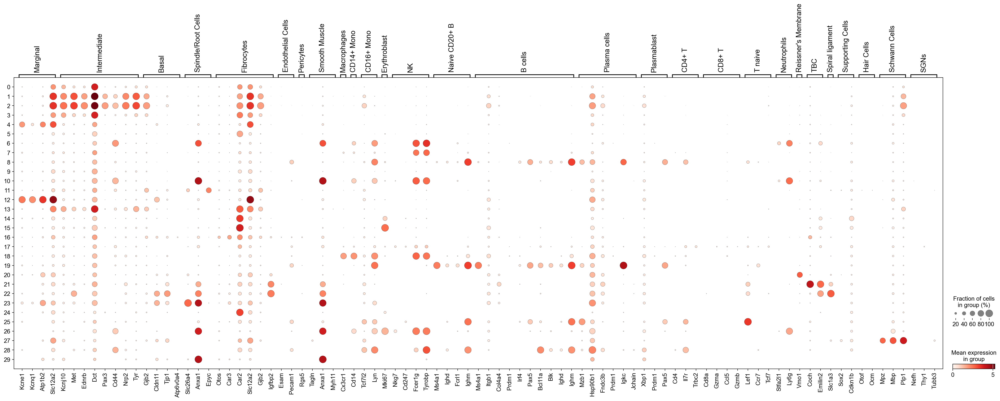

In [26]:
#View marker genes at various Leiden resolutions
sc.pl.dotplot(adata, marker_genes, groupby='leiden');

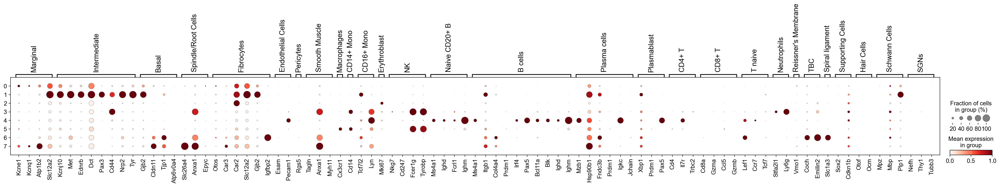

In [27]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.02", standard_scale="var")

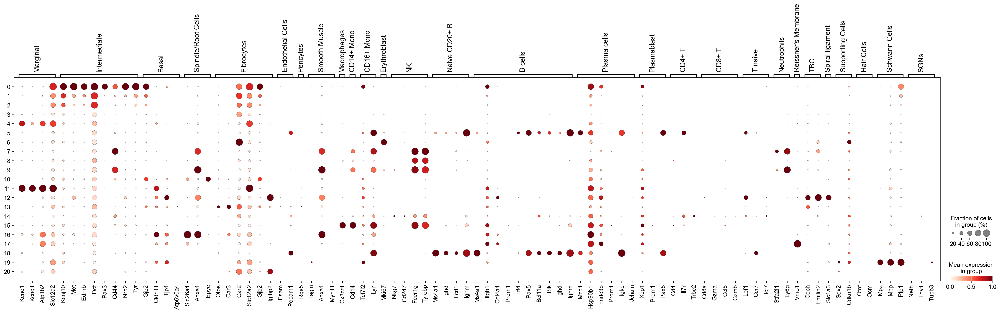

In [28]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.50", standard_scale="var")

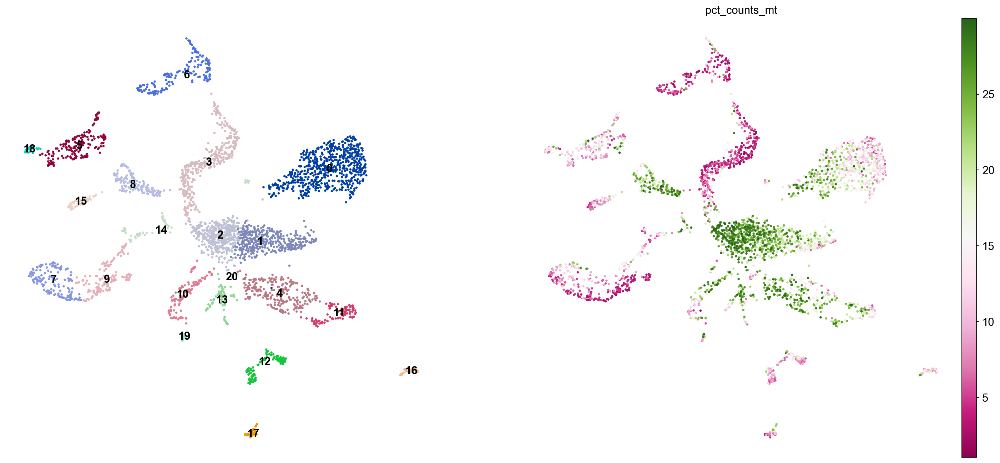

In [29]:
#Plot UMAP with chosen resolution
with mpl.rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color=['leiden_res_0.50', 'pct_counts_mt'], legend_loc='on data', title='', frameon=False, cmap='PiYG')

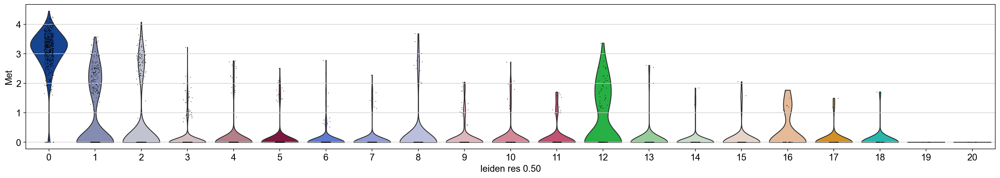

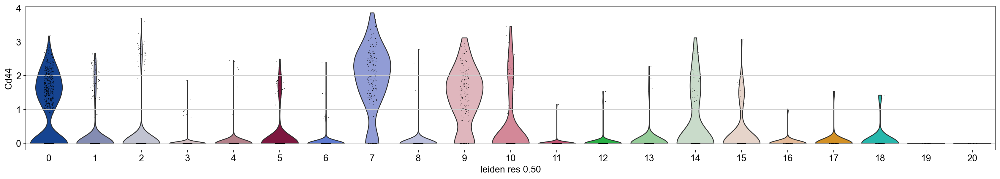

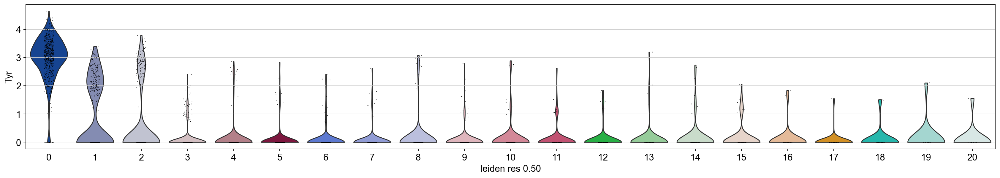

In [30]:
#violin plot looking at IC Markers (Dct is so widespread in this dataset I decided to not use it for cluster annotation)
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Met'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Cd44'], groupby='leiden_res_0.50') 
    sc.pl.violin(adata, ['Tyr'], groupby='leiden_res_0.50') #neural crest marker

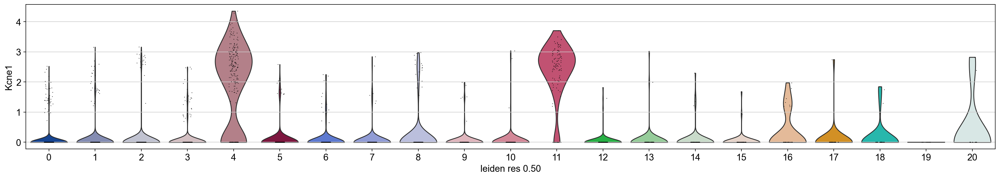

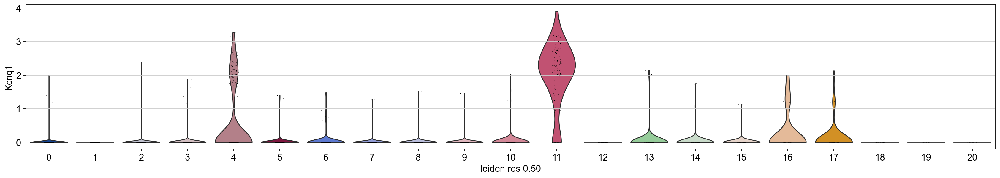

In [31]:
#violin plot looking at MC Markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Kcne1'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Kcnq1'], groupby='leiden_res_0.50')

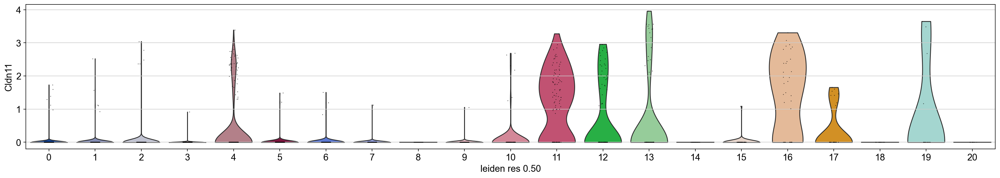

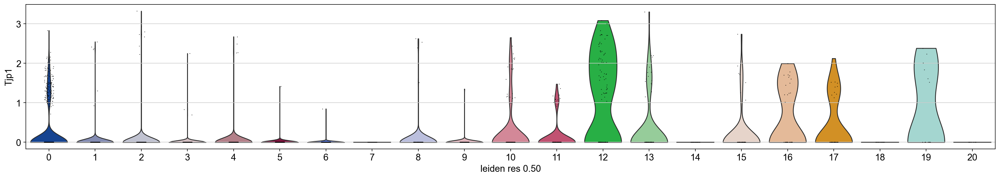

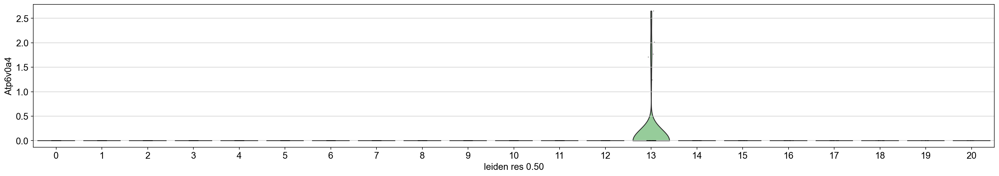

In [32]:
#violin plot looking at BC Markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Cldn11'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Tjp1'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Atp6v0a4'], groupby='leiden_res_0.50')

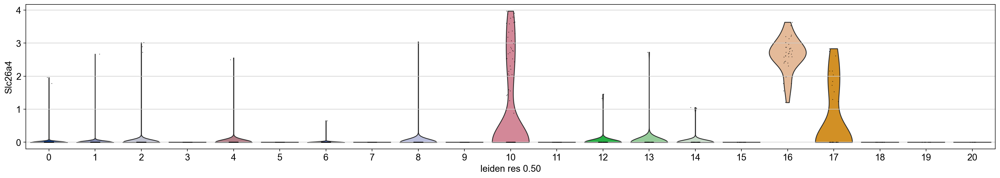

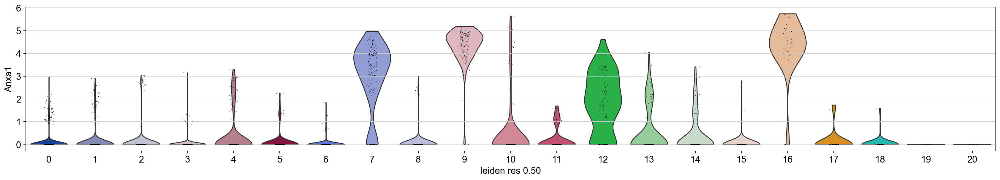

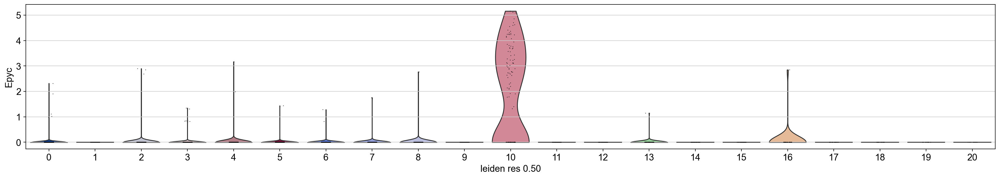

In [33]:
#violin plot looking at Spindle/Root Cell markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Slc26a4'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Anxa1'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Epyc'], groupby='leiden_res_0.50')

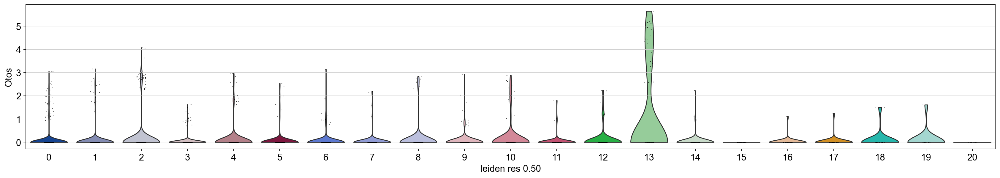

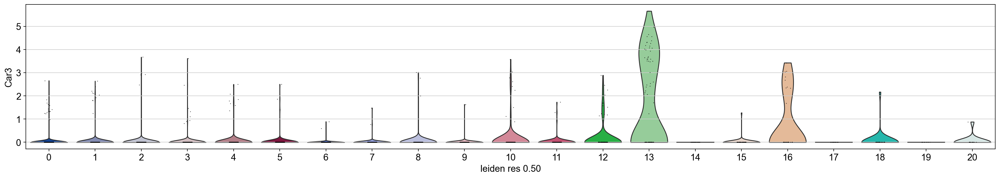

In [34]:
#violin plot looking at Fibrocyte markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Otos'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Car3'], groupby='leiden_res_0.50')

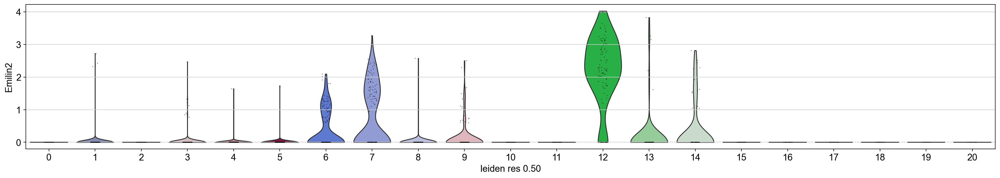

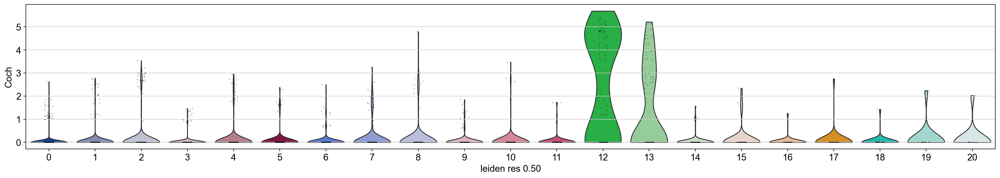

In [44]:
#violin plot looking at TBC/SL markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Emilin2'], groupby='leiden_res_0.50') #TBC
    sc.pl.violin(adata, ['Coch'], groupby='leiden_res_0.50') #SL

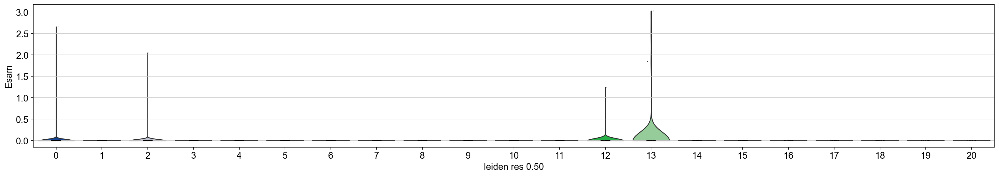

In [35]:
#violin plot looking at Endothelial Cell markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Esam'], groupby='leiden_res_0.50')

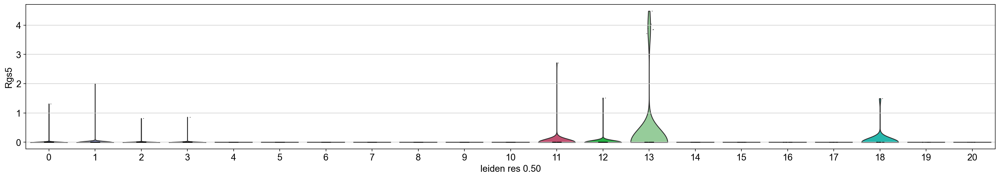

In [36]:
#violin plot looking at Pericyte markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Rgs5'], groupby='leiden_res_0.50')

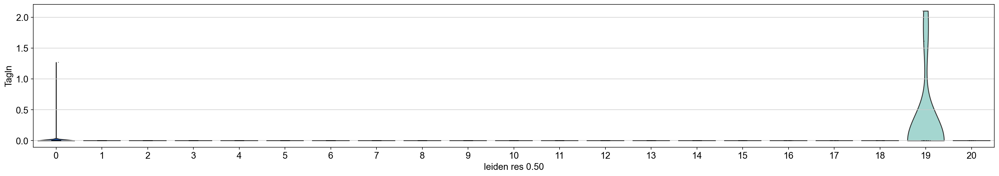

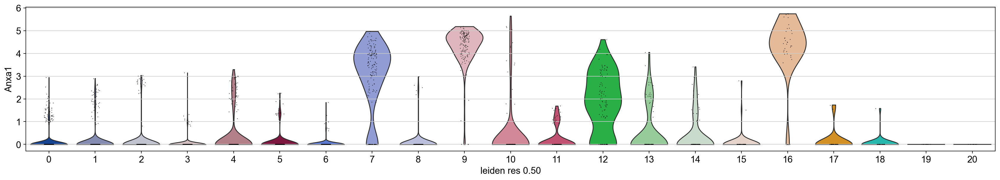

In [37]:
#violin plot looking at SMC markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Tagln'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Anxa1'], groupby='leiden_res_0.50')

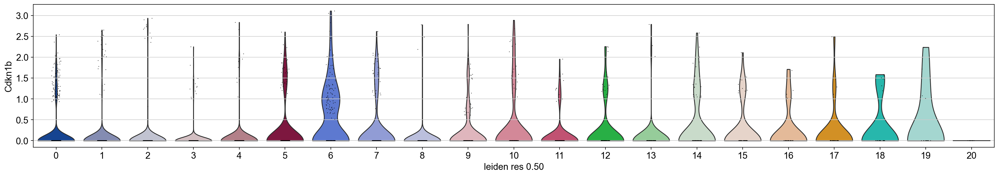

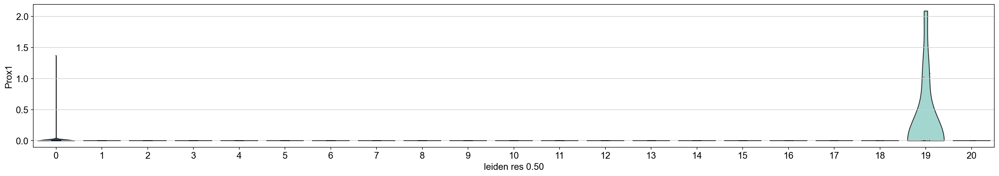

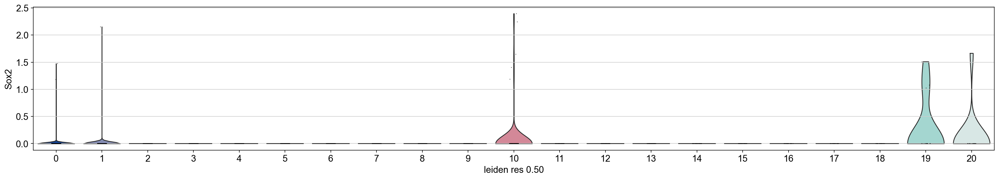

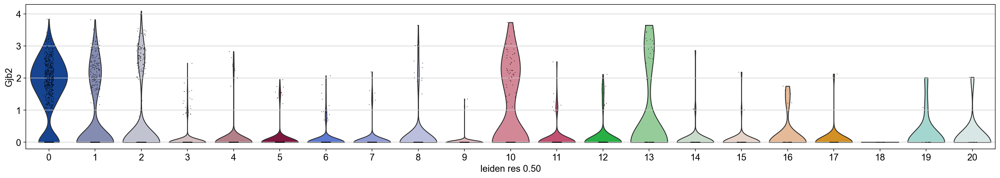

In [38]:
#violin plot looking at Supporting Cell markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Cdkn1b'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Prox1'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Sox2'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Gjb2'], groupby='leiden_res_0.50')

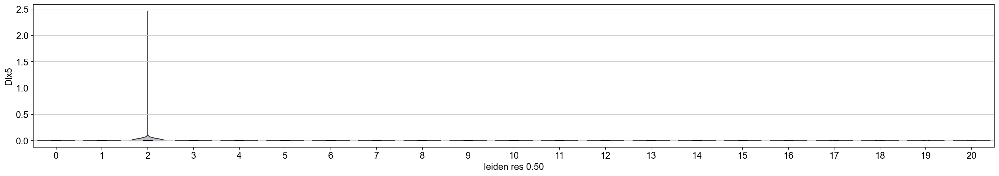

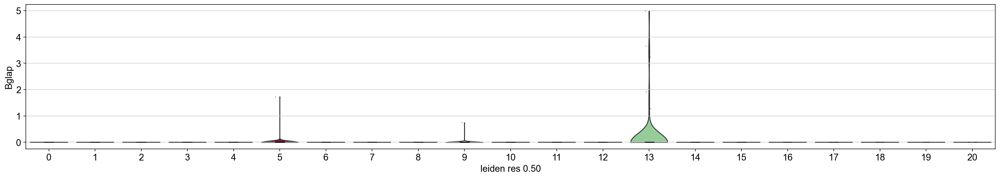

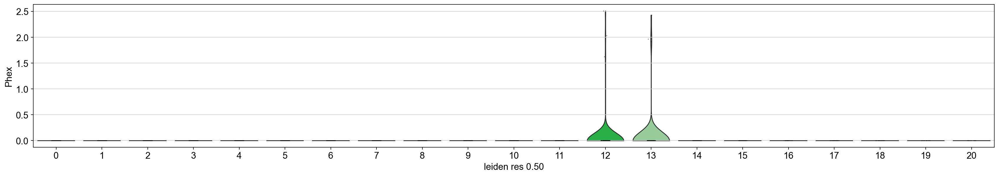

In [39]:
#violin plot looking at Pre/Osteoblast/cyte Cell markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Dlx5'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Bglap'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['Phex'], groupby='leiden_res_0.50')

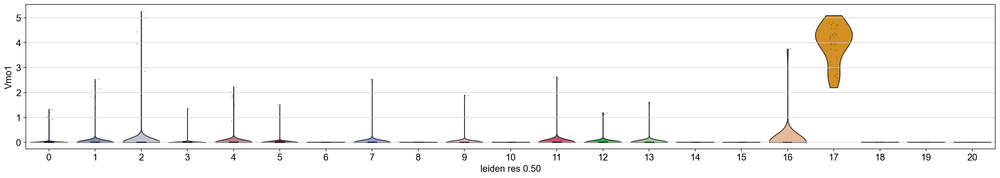

In [40]:
#violin plot looking at Reissner's Membrane Cell markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Vmo1'], groupby='leiden_res_0.50')

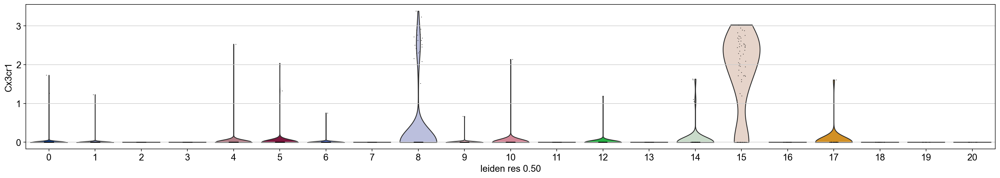

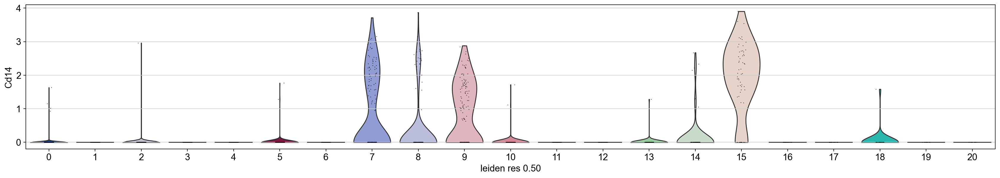

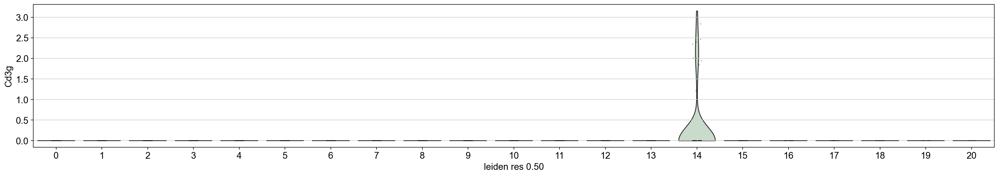

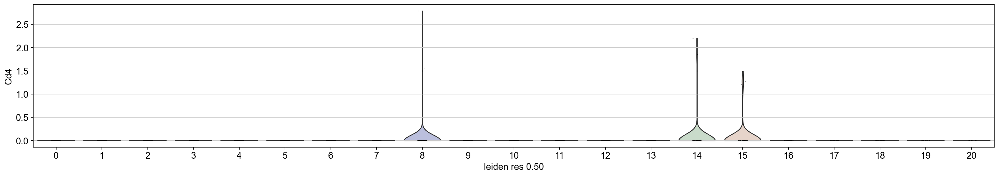

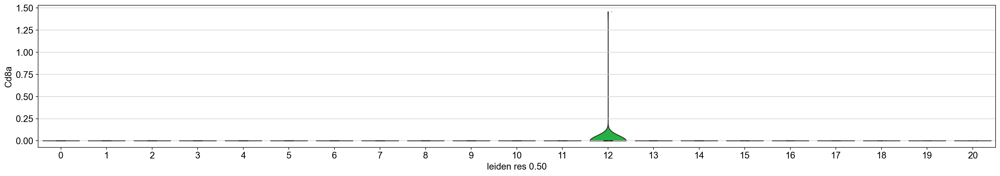

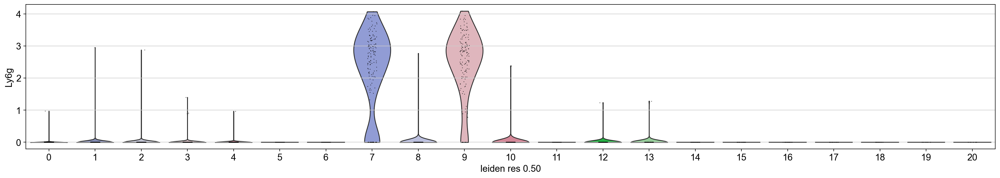

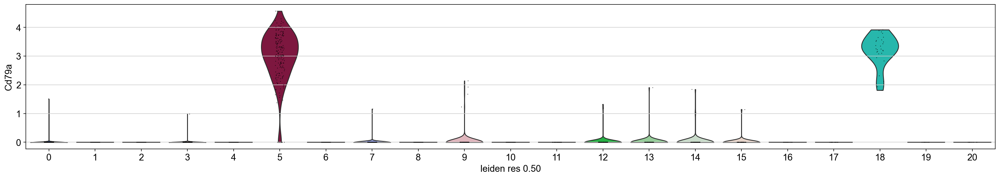

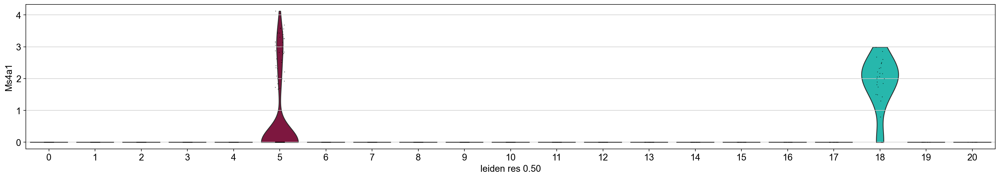

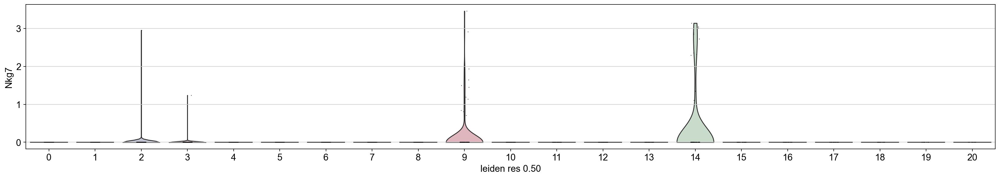

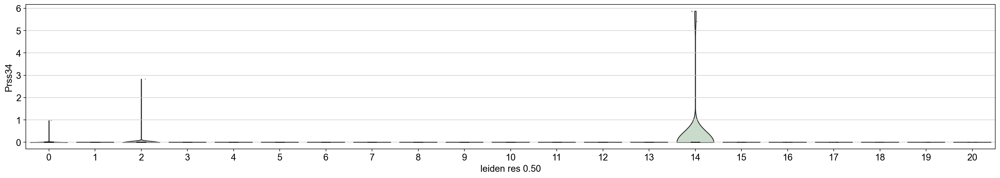

In [41]:
#violin plot looking at Circulating/Immune Cell markers
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['Cx3cr1'], groupby='leiden_res_0.50') #resident macrophages
    sc.pl.violin(adata, ['Cd14'], groupby='leiden_res_0.50') #monocytes
    sc.pl.violin(adata, ['Cd3g'], groupby='leiden_res_0.50') #T Cells
    sc.pl.violin(adata, ['Cd4'], groupby='leiden_res_0.50') #Th
    sc.pl.violin(adata, ['Cd8a'], groupby='leiden_res_0.50') #Tc
    sc.pl.violin(adata, ['Ly6g'], groupby='leiden_res_0.50') #neutrophils
    sc.pl.violin(adata, ['Cd79a'], groupby='leiden_res_0.50') #B cells
    sc.pl.violin(adata, ['Ms4a1'], groupby='leiden_res_0.50') #naive B cell
    sc.pl.violin(adata, ['Nkg7'], groupby='leiden_res_0.50') #NK
    sc.pl.violin(adata, ['Prss34'], groupby='leiden_res_0.50') #mast cells

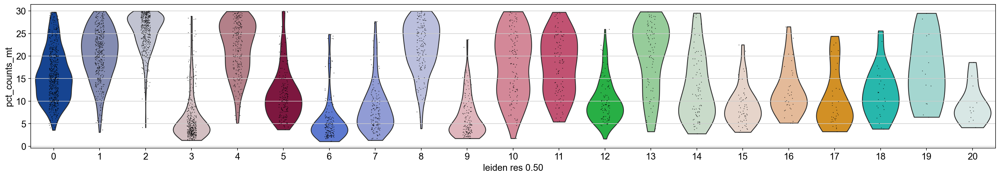

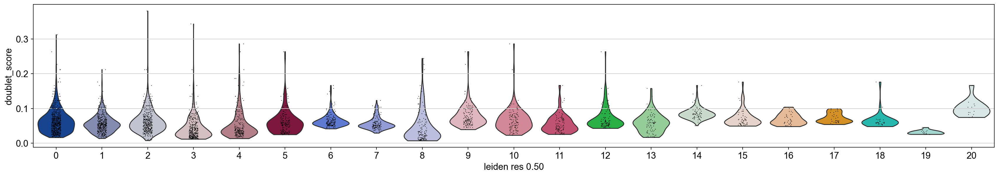

In [42]:
#violin plots looking at QC metrics
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['pct_counts_mt'], groupby='leiden_res_0.50')
    sc.pl.violin(adata, ['doublet_score'], groupby='leiden_res_0.50')

In [55]:
#rename clusters
new_cluster_names = ["Intermediate Cells", "Damaged IC1", "Damaged IC2", "Hb+", "Marginal Cells1", "Activated B Cells", "Supporting Cells1", "Neutrophils1", "Macrophages1", "Neutrophils2", "Root Cells", "Cldn11+ Marginal Cells" , "Basal Cells/TBC/Fibrocyte",
                    "Basal/Fibrocytes", "T/Mast/NK", "Macrophages2", "Spindle Cells", "Reissner's Membrane", "Naïve B Cells", "Schwann Cells", "?"]
adata.rename_categories('leiden_res_0.50', new_cluster_names)

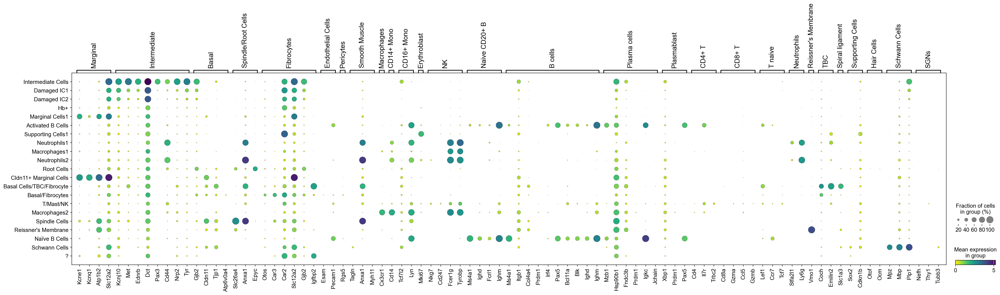

In [56]:
#Renamed dotplot
sc.pl.dotplot(adata, marker_genes, groupby='leiden_res_0.50',
                      cmap='viridis_r');

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.50']`
categories: Intermediate Cells, Damaged IC1, Damaged IC2, etc.
var_group_labels: Marginal, Intermediate, Basal, etc.


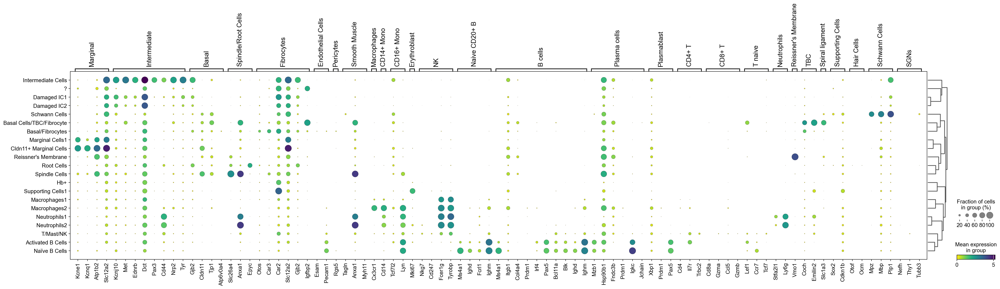

In [57]:
#define dendrogram and plot marker genes with dendrogram included at resolution = 0.50
sc.tl.dendrogram(adata, groupby='leiden_res_0.50')
sc.pl.dotplot(adata, marker_genes, groupby='leiden_res_0.50', dendrogram=True,
                      cmap='viridis_r');

In [58]:
#cell counts by cluster
adata.obs["leiden_res_0.50"].value_counts()

leiden_res_0.50
Intermediate Cells           652
Damaged IC1                  422
Damaged IC2                  418
Hb+                          375
Marginal Cells1              235
Activated B Cells            180
Supporting Cells1            168
Neutrophils1                 148
Macrophages1                 146
Neutrophils2                 142
Root Cells                   116
Cldn11+ Marginal Cells       100
Basal Cells/TBC/Fibrocyte     96
Basal/Fibrocytes              79
T/Mast/NK                     75
Macrophages2                  57
Spindle Cells                 34
Reissner's Membrane           33
Naïve B Cells                 28
Schwann Cells                 14
?                             13
Name: count, dtype: int64

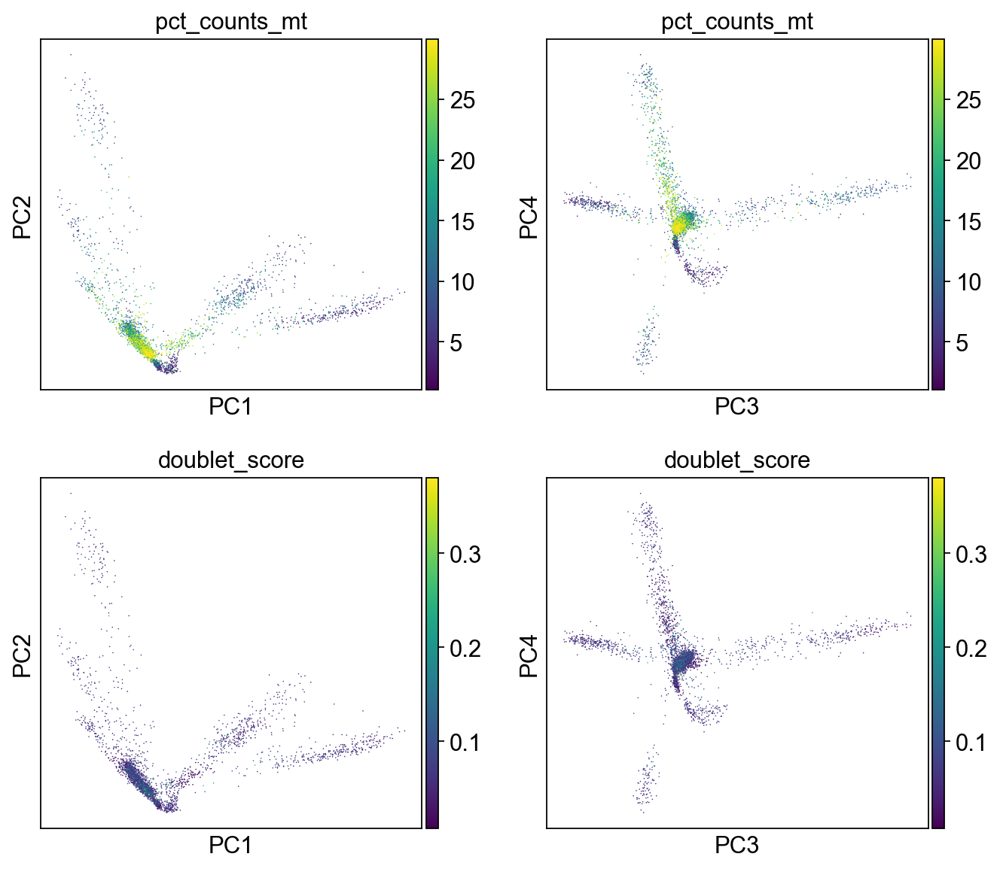

In [59]:
#PCA plot by Mt rna, looking at top 4 PCs
sc.pl.pca(
    adata,
    color=["pct_counts_mt", "pct_counts_mt", "doublet_score", "doublet_score"],
    dimensions=[(0, 1), (2, 3), (0,1), (2,3)],
    ncols=2,
    size=2,
)

In [60]:
#identify top DEGs per cluster
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_grou

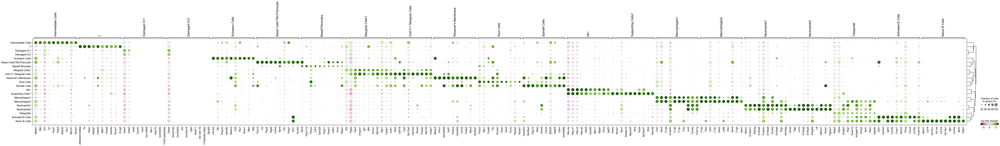

In [61]:
#plot top DEGs per cluster
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=10,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="PiYG",
)

/Users/rvi33352/miniforge3/envs/scrnaseq/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


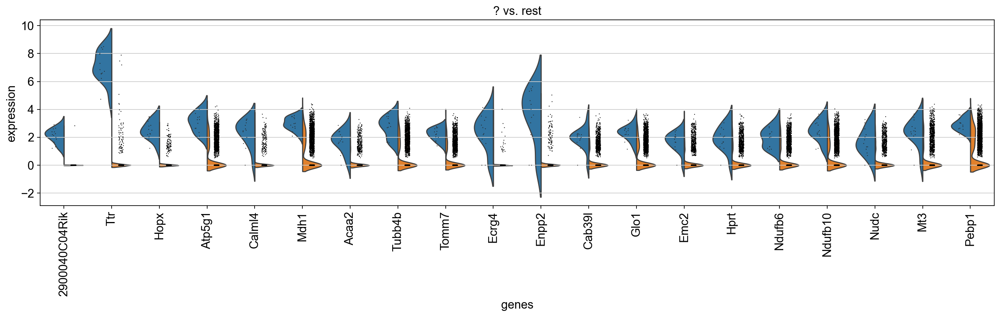

In [63]:
#look at unknown cluster
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.rank_genes_groups_violin(adata, groups=['?'], n_genes=20)

categories: Intermediate Cells, Damaged IC1, Damaged IC2, etc.
var_group_labels: Marginal, Intermediate, Basal, etc.


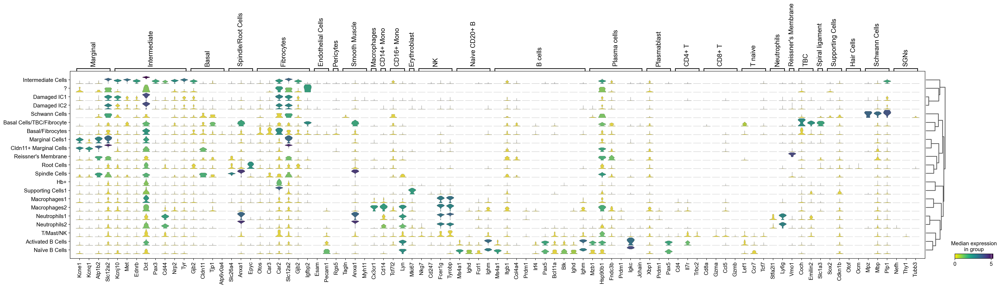

In [64]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden_res_0.50', dendrogram=True,
                      cmap='viridis_r');

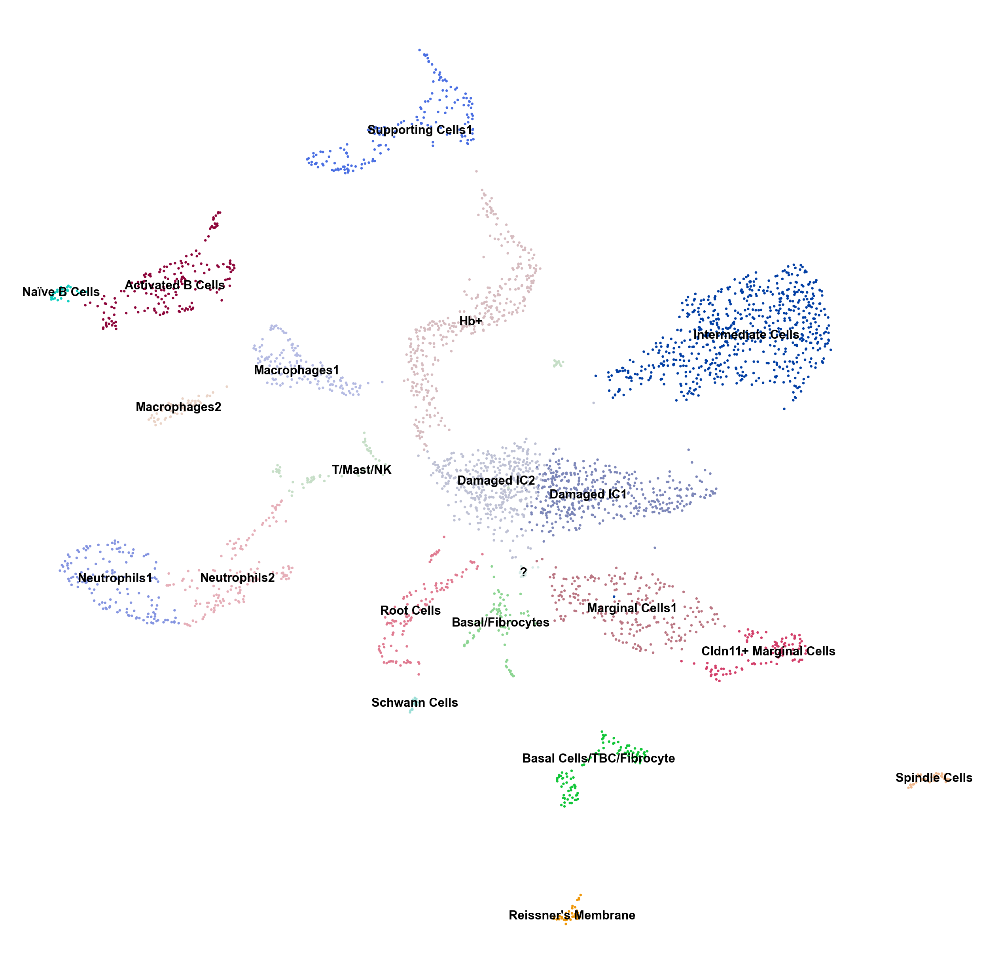

In [66]:
with mpl.rc_context({'figure.figsize': (20, 20)}):
    sc.pl.umap(adata, color=['leiden_res_0.50'], legend_loc='on data', title='', frameon=False)

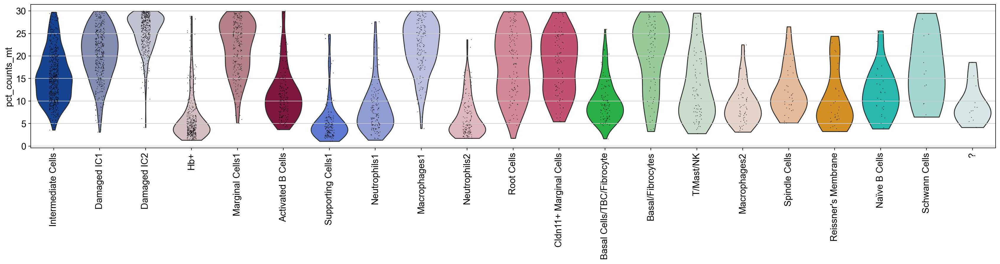

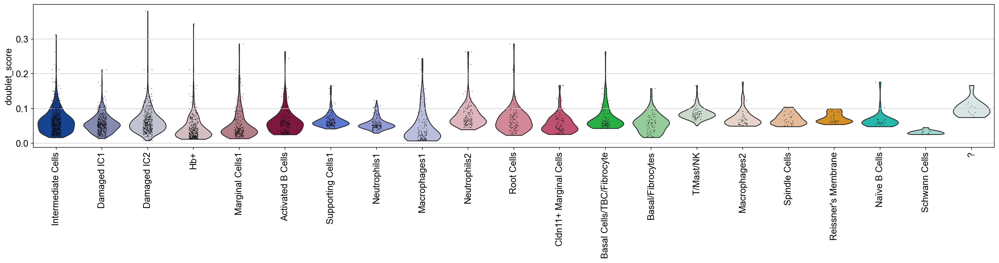

In [67]:
#violin plots looking at QC metrics
with mpl.rc_context({'figure.figsize': (20, 4)}):
    sc.pl.violin(adata, ['pct_counts_mt'], groupby='leiden_res_0.50', rotation=90)
    sc.pl.violin(adata, ['doublet_score'], groupby='leiden_res_0.50', rotation=90)